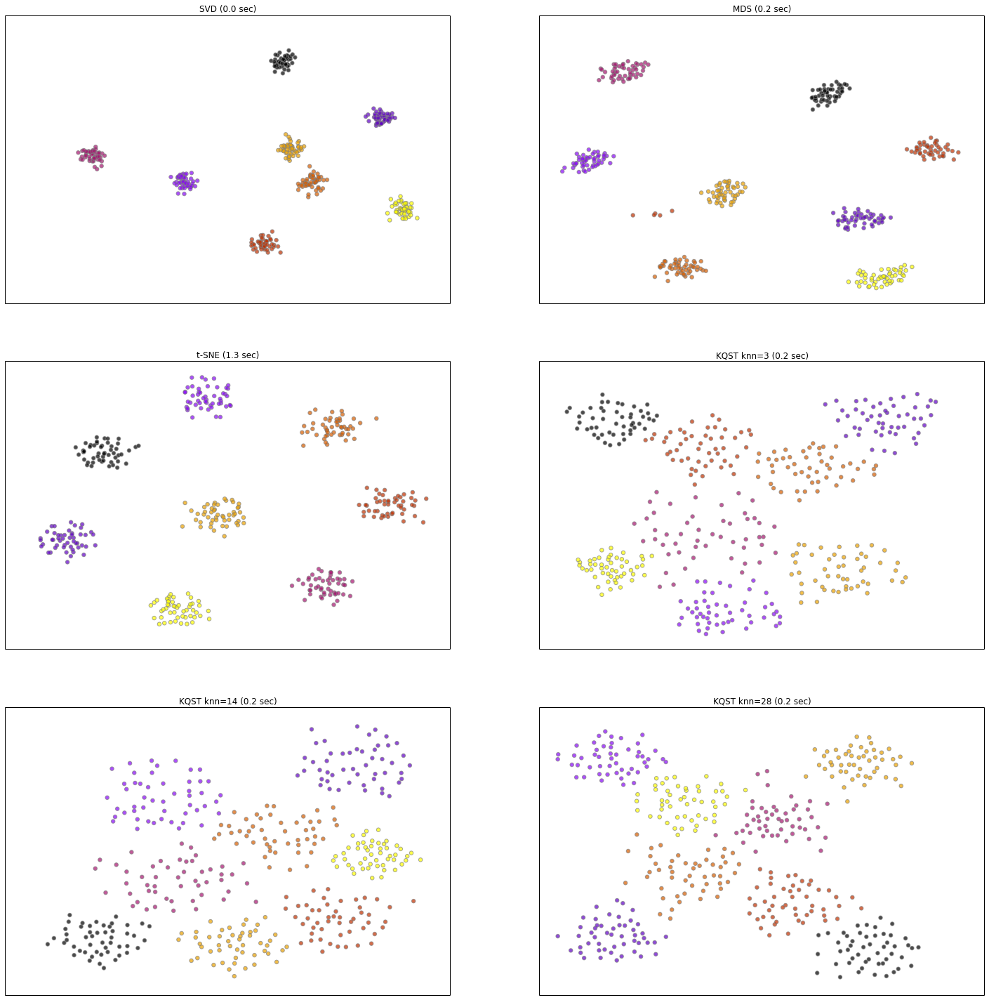

In [3]:
%matplotlib inline
from sklearn.datasets.samples_generator import make_blobs
X, y = make_blobs(n_samples=400, centers=8, n_features=20,random_state=0)

from eden.util.display import plot_embeddings
plot_embeddings(X,y, knn=14, knn_density=4)

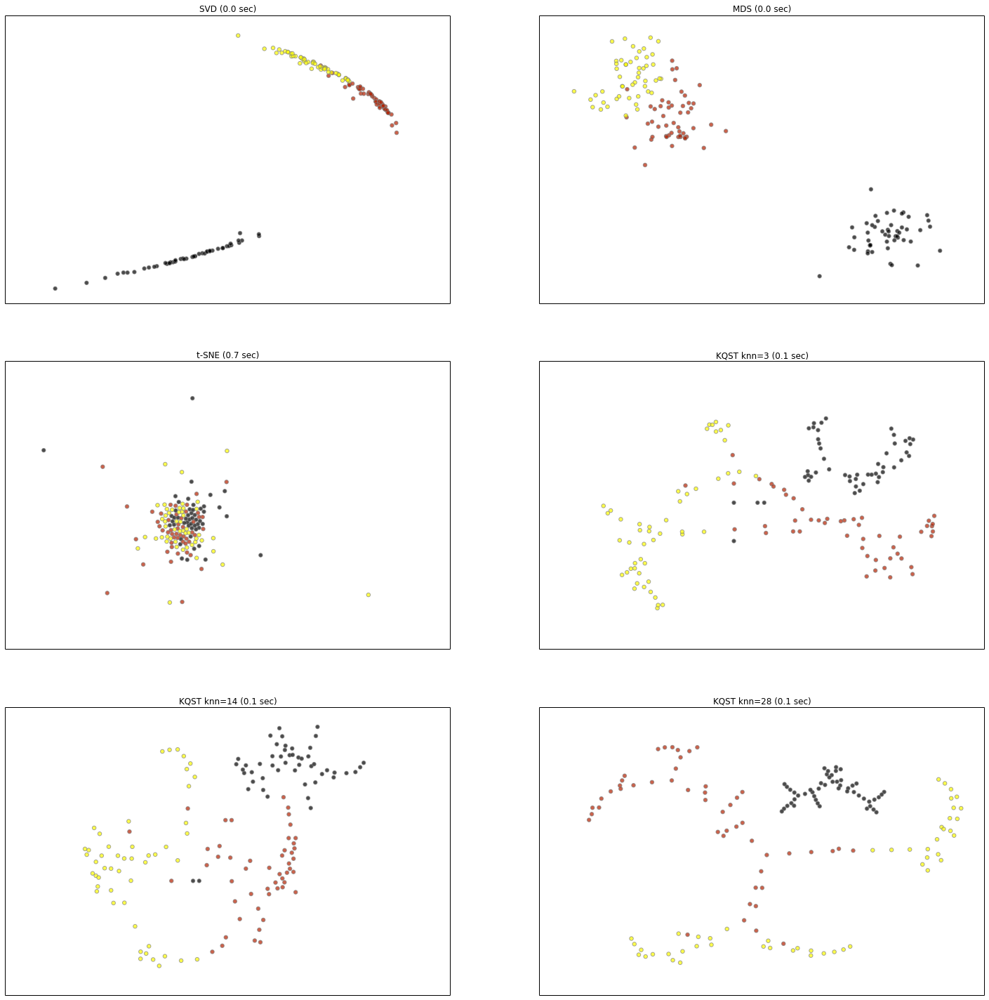

In [8]:
%matplotlib inline
from sklearn import datasets
iris = datasets.load_iris()
X = iris.data
y = iris.target
from sklearn.preprocessing import normalize,scale
X = normalize(X)
labels=[str(y_val)+'_'+str(i) for i,y_val in enumerate(y)]
from eden.util.display import plot_embeddings
plot_embeddings(X,y, labels=None, knn=14, knn_density=8)

ARS: 0.684827406992


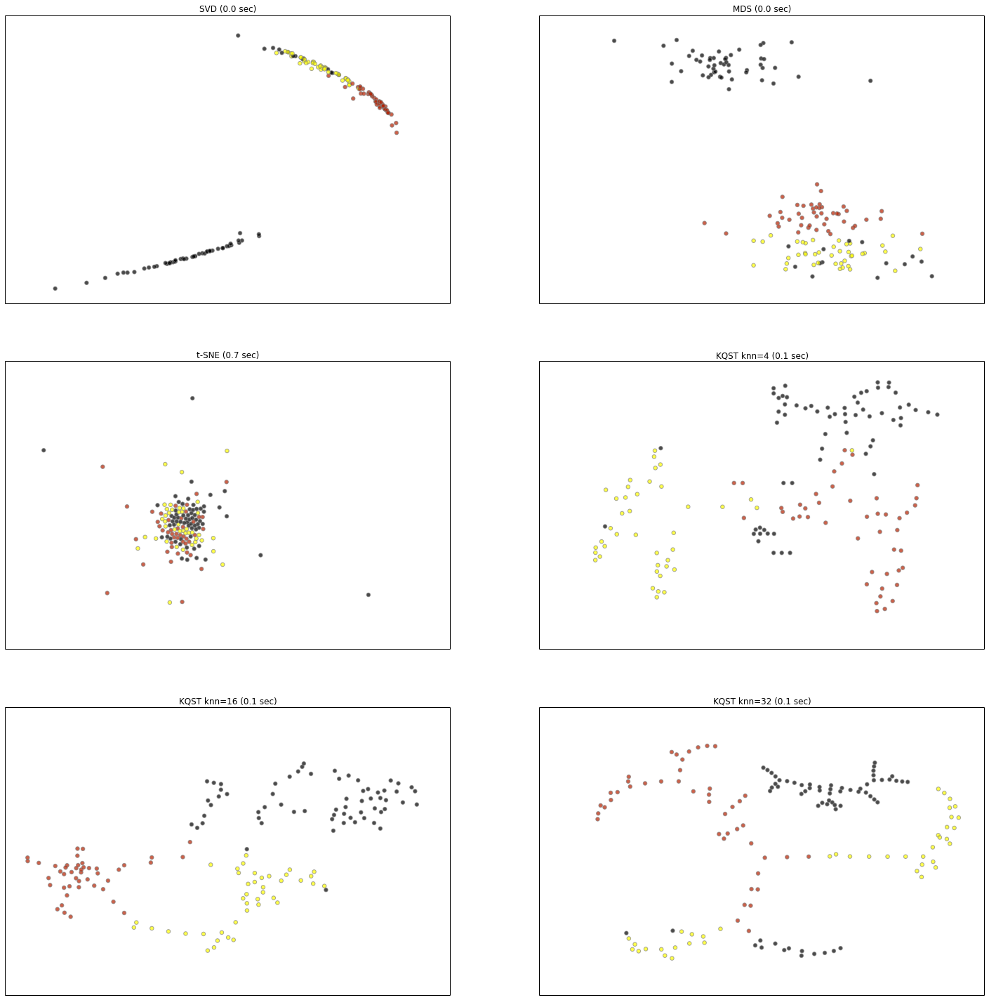

In [9]:
%matplotlib inline
from eden.util.display import KernelQuickShiftTreeEmbedding
Xemb=KernelQuickShiftTreeEmbedding(X, knn=16, k_threshold=0.9, metric='rbf', gamma=1e-4)
from sklearn.cluster import KMeans
km = KMeans(init='k-means++', n_clusters=len(set(y)), n_init=10)
yp = km.fit_predict(Xemb)
from sklearn.metrics import adjusted_rand_score 
print 'ARS:', adjusted_rand_score(y,yp)
from eden.util.display import plot_embeddings
plot_embeddings(X,yp)

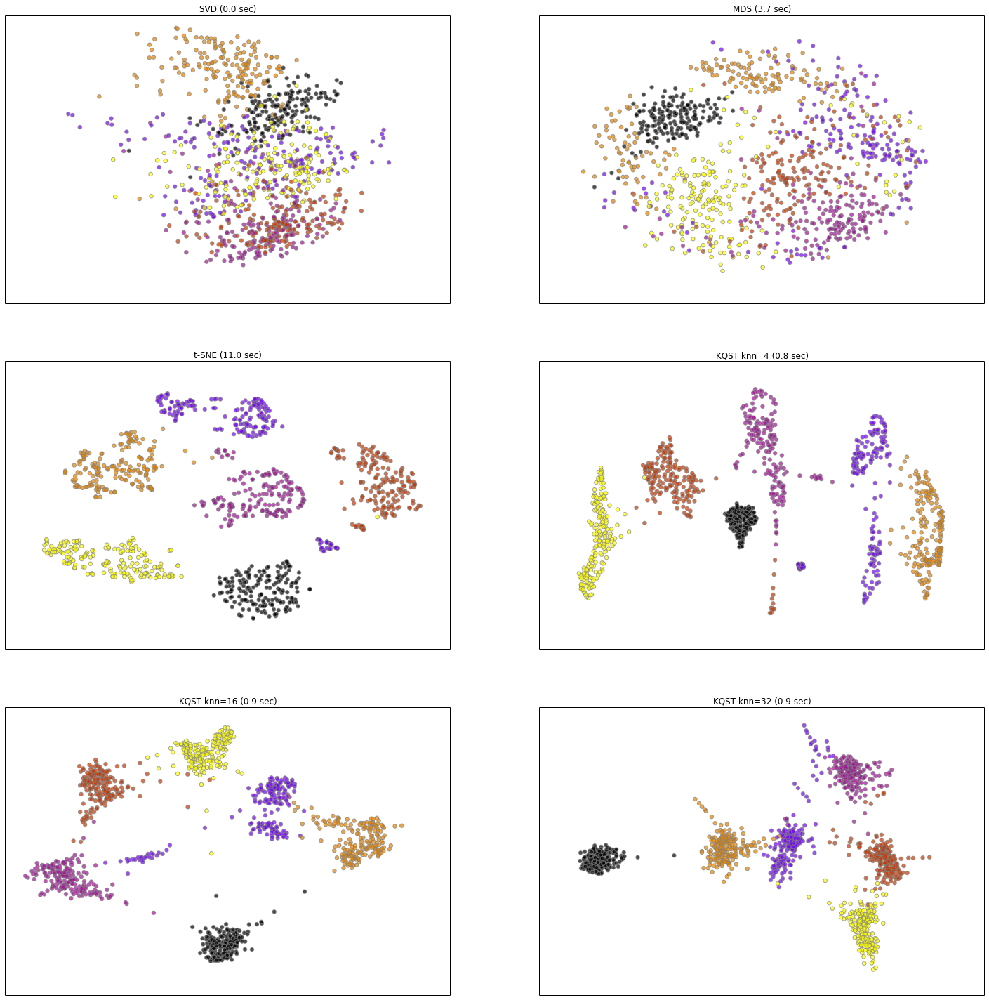

CPU times: user 16.2 s, sys: 2.05 s, total: 18.2 s
Wall time: 19.1 s


In [10]:
%%time
%matplotlib inline
from sklearn import datasets
digits = datasets.load_digits(n_class=6)
X = digits.data
y = digits.target
from sklearn.preprocessing import normalize,scale
X = normalize(X)
from eden.util.display import plot_embeddings
plot_embeddings(X,y)

ARS: 0.894910550446


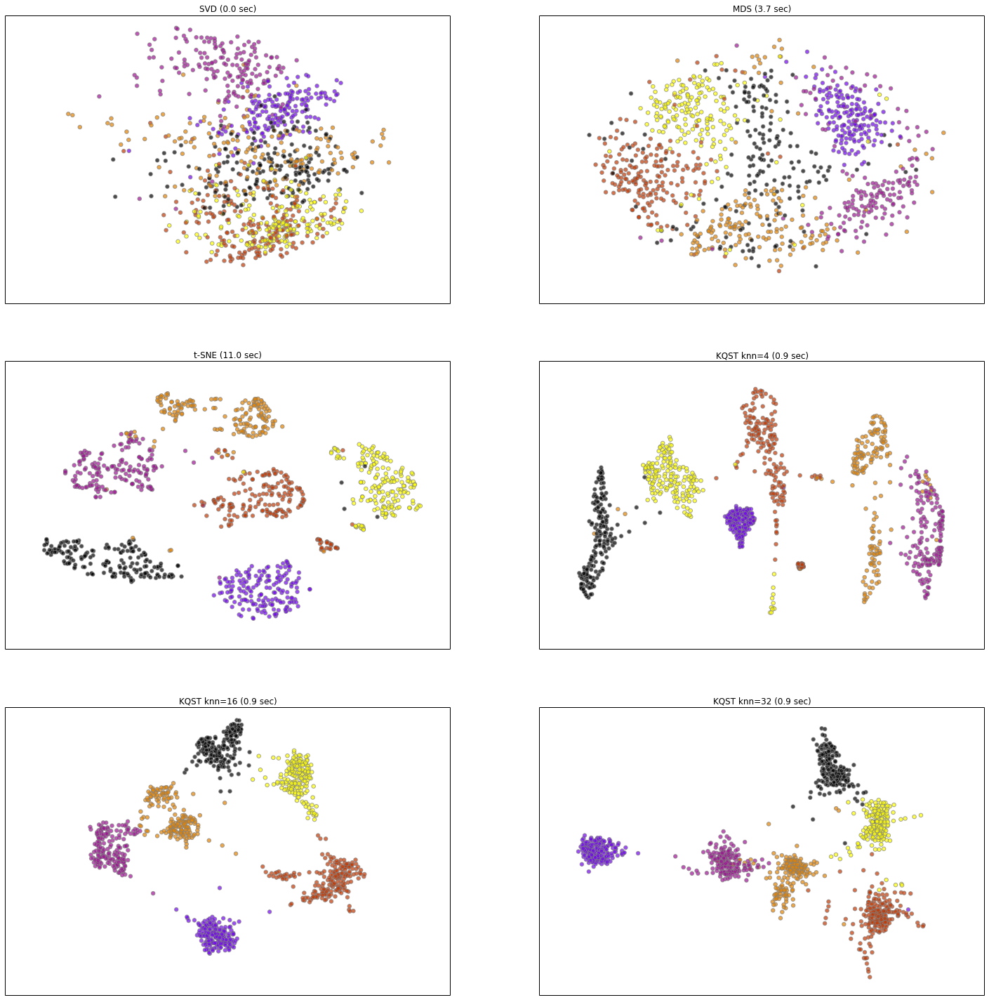

In [11]:
%matplotlib inline
from eden.util.display import KernelQuickShiftTreeEmbedding
Xemb=KernelQuickShiftTreeEmbedding(X, knn=16, k_threshold=0.9, metric='rbf', gamma=1e-4)
from sklearn.cluster import KMeans
km = KMeans(init='k-means++', n_clusters=len(set(y)), n_init=10)
yp = km.fit_predict(Xemb)
from sklearn.metrics import adjusted_rand_score 
print 'ARS:', adjusted_rand_score(y,yp)
from eden.util.display import plot_embeddings
plot_embeddings(X,yp)

In [1]:
def rfam_to_matrix(rfam_id, n_max=50):
    def rfam_uri(family_id):
        return 'http://rfam.xfam.org/family/%s/alignment?acc=%s&format=fastau&download=0'%(family_id,family_id)

    from eden.converter.fasta import fasta_to_sequence
    seqs = fasta_to_sequence(rfam_uri(rfam_id))
    from itertools import islice
    seqs = islice(seqs,n_max)
    from eden.converter.rna.rnafold import rnafold_to_eden
    graphs = rnafold_to_eden(seqs)

    from eden.graph import Vectorizer
    vectorizer = Vectorizer( complexity=1 )
    X = vectorizer.transform(graphs)
    return X

def rfam_data(rfam_ids, n_max=50):
    import numpy as np
    from scipy.sparse import vstack
    for i,rfam_id in enumerate(rfam_ids):
        X_=rfam_to_matrix(rfam_id, n_max=n_max)
        y_ = [i] * X_.shape[0]
        if i==0:
            X=X_
            y=y_
        else:
            X = vstack([X, X_], format="csr")
            y=y+y_
    y = np.array(y)
    return X,y

CPU times: user 16 s, sys: 2.26 s, total: 18.2 s
Wall time: 33.5 s


/Library/Python/2.7/site-packages/pygraphviz/agraph.py:1281: RuntimeWarning: Fontconfig warning: ignoring UTF-8: not a valid region tag

  warnings.warn("".join(errors),RuntimeWarning)


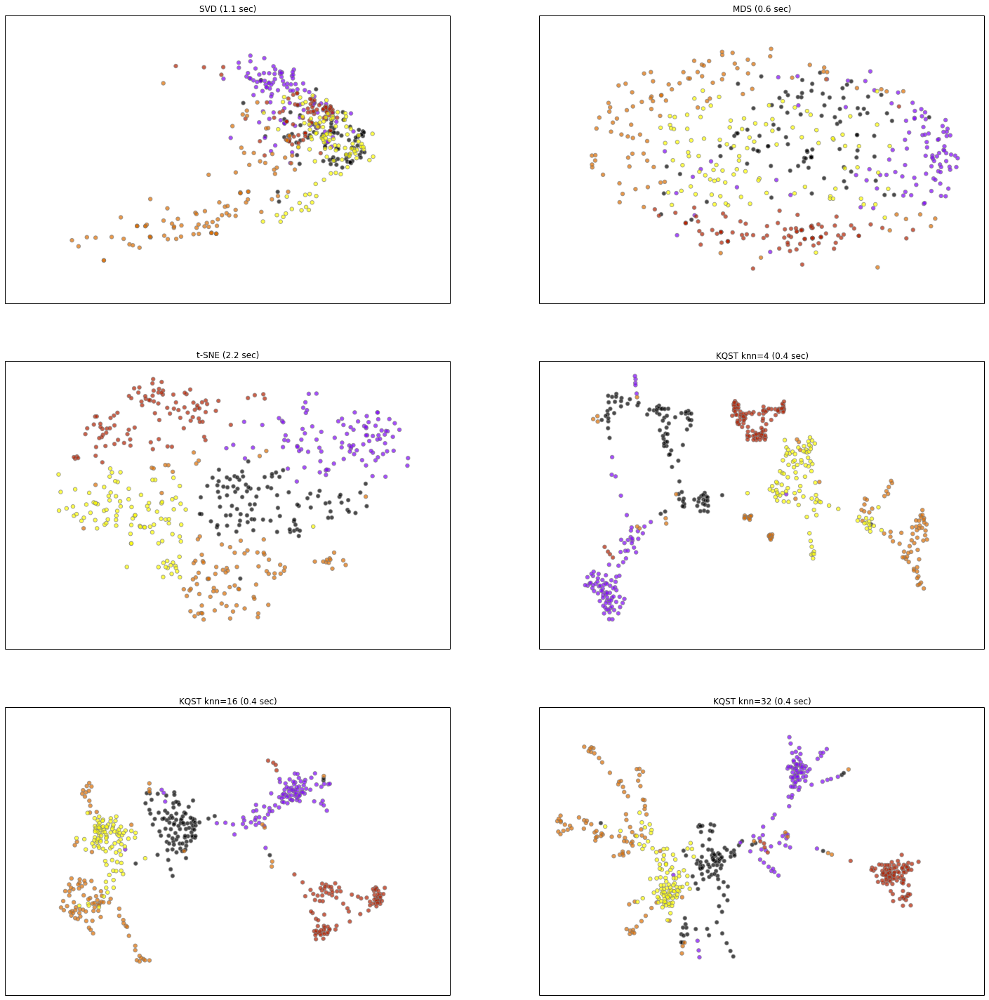

In [2]:
%%time
%matplotlib inline
rfam_ids=['RF00004','RF00005','RF00015','RF00020','RF00026','RF00169',
          'RF00380','RF00386','RF01051','RF01055','RF01234','RF01699',
          'RF01701','RF01705','RF01731','RF01734','RF01745','RF01750',
          'RF01942','RF01998','RF02005','RF02012','RF02034']

X,y = rfam_data(rfam_ids[2:7],n_max=100)

from eden.util.display import plot_embeddings
plot_embeddings(X,y, save_image_file_name='RNA_2D_embedding.pdf')

ARS: 0.596708029238


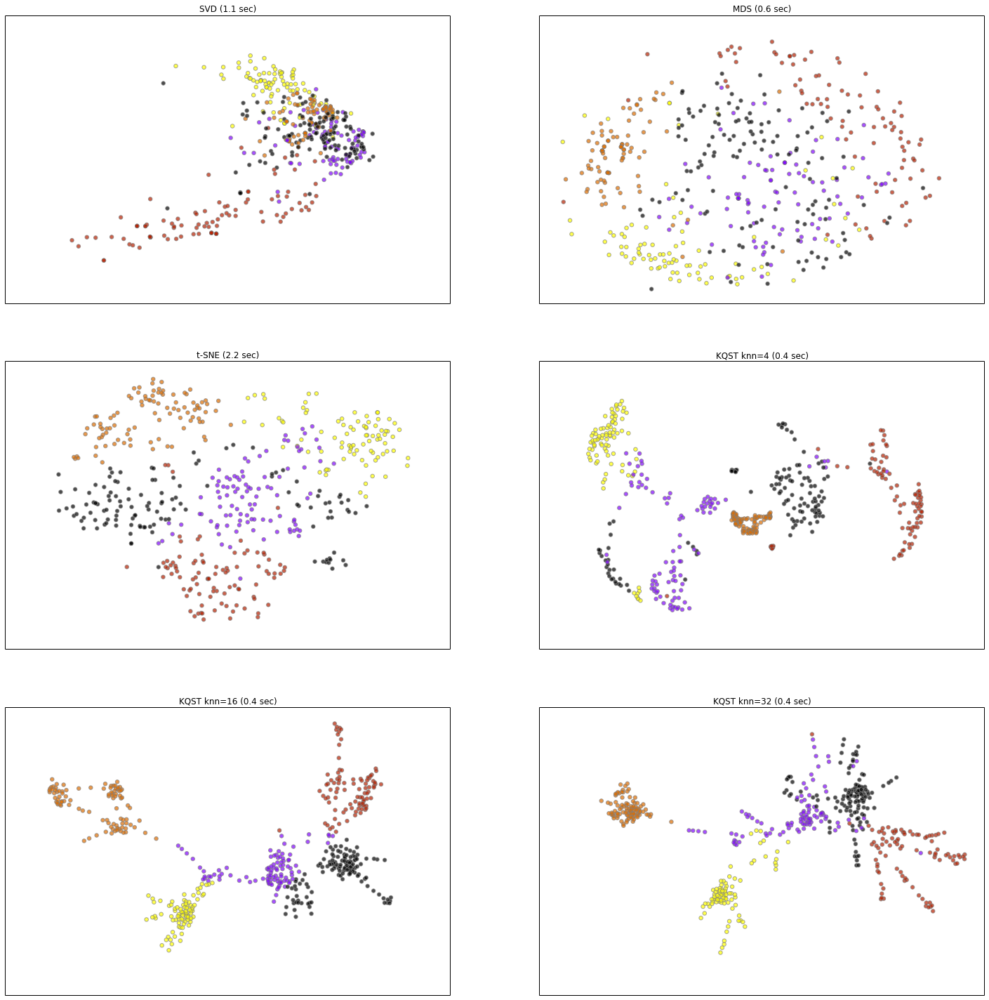

In [11]:
%matplotlib inline
from eden.util.display import KernelQuickShiftTreeEmbedding
Xemb=KernelQuickShiftTreeEmbedding(X, knn=16, k_threshold=0.9, metric='rbf', gamma=1e-4)
from sklearn.cluster import KMeans
km = KMeans(init='k-means++', n_clusters=len(set(y)), n_init=10)
yp = km.fit_predict(Xemb)
from sklearn.metrics import adjusted_rand_score 
print 'ARS:', adjusted_rand_score(y,yp)
from eden.util.display import plot_embeddings
plot_embeddings(X,yp)

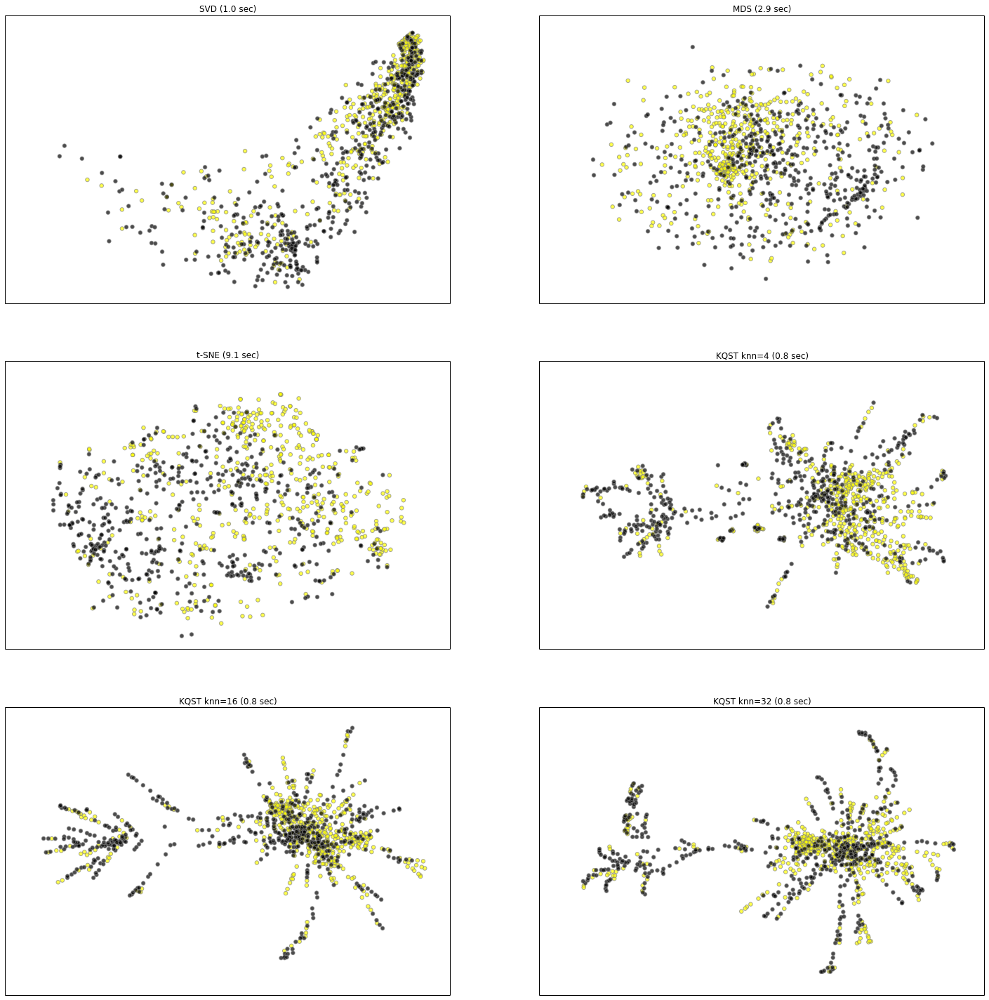

CPU times: user 18.9 s, sys: 1.8 s, total: 20.7 s
Wall time: 20.9 s


In [12]:
%%time
%matplotlib inline
pos = 'bursi.pos.gspan'
neg = 'bursi.neg.gspan'

from eden.converter.graph.gspan import gspan_to_eden
from itertools import islice
n_max=500
iterable_pos = islice(gspan_to_eden( pos ),n_max)
iterable_neg = islice(gspan_to_eden( neg ),n_max)

from eden.graph import Vectorizer
vectorizer = Vectorizer( complexity=1 )

import numpy as np
from scipy.sparse import vstack
Xpos = vectorizer.transform(iterable_pos)
Xneg = vectorizer.transform(iterable_neg)
yp = [1] * Xpos.shape[0]
yn = [-1] * Xneg.shape[0]
y = np.array(yp + yn)
X = vstack([Xpos, Xneg], format="csr")

from eden.util.display import plot_embeddings
plot_embeddings(X,y)

ARS: 0.0477630554749


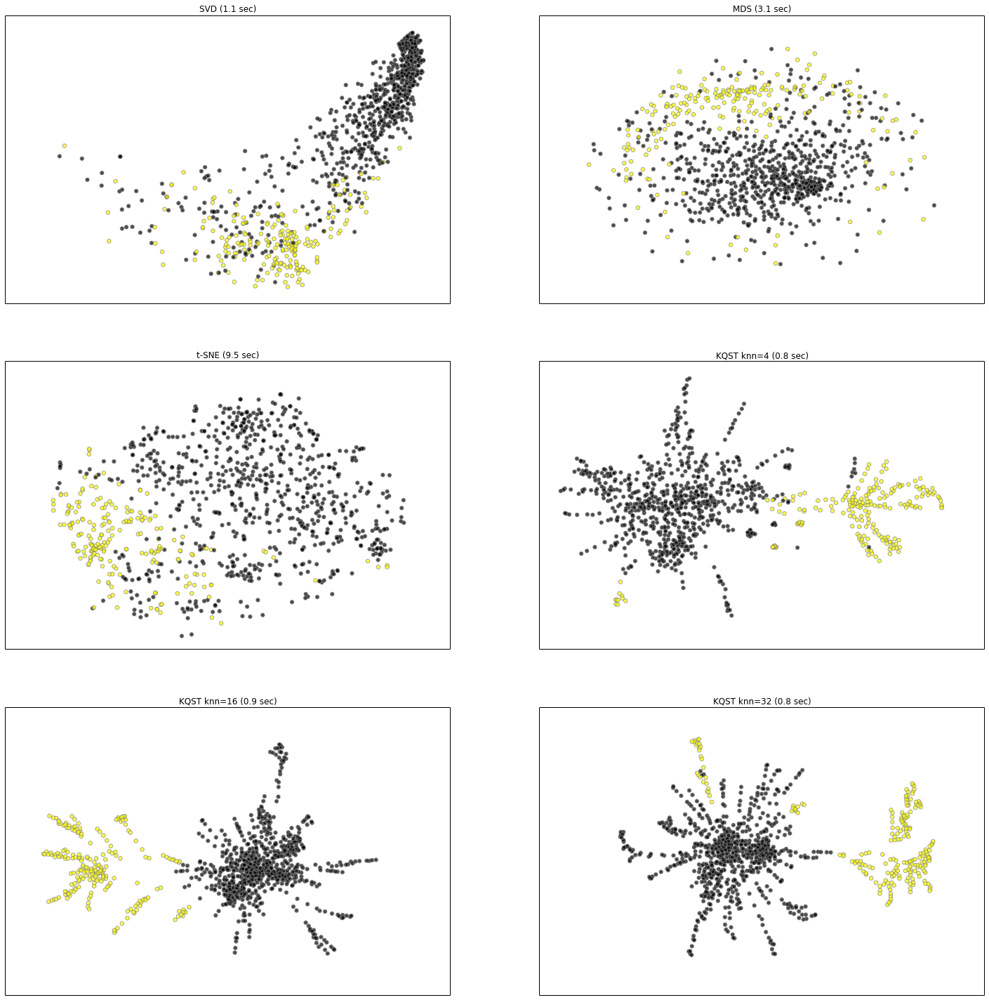

In [13]:
%matplotlib inline
from eden.util.display import KernelQuickShiftTreeEmbedding
Xemb=KernelQuickShiftTreeEmbedding(X, knn=16, k_threshold=0.9, metric='rbf', gamma=1e-4)
from sklearn.cluster import KMeans
km = KMeans(init='k-means++', n_clusters=len(set(y)), n_init=10)
yp = km.fit_predict(Xemb)
from sklearn.metrics import adjusted_rand_score 
print 'ARS:', adjusted_rand_score(y,yp)
from eden.util.display import plot_embeddings
plot_embeddings(X,yp)

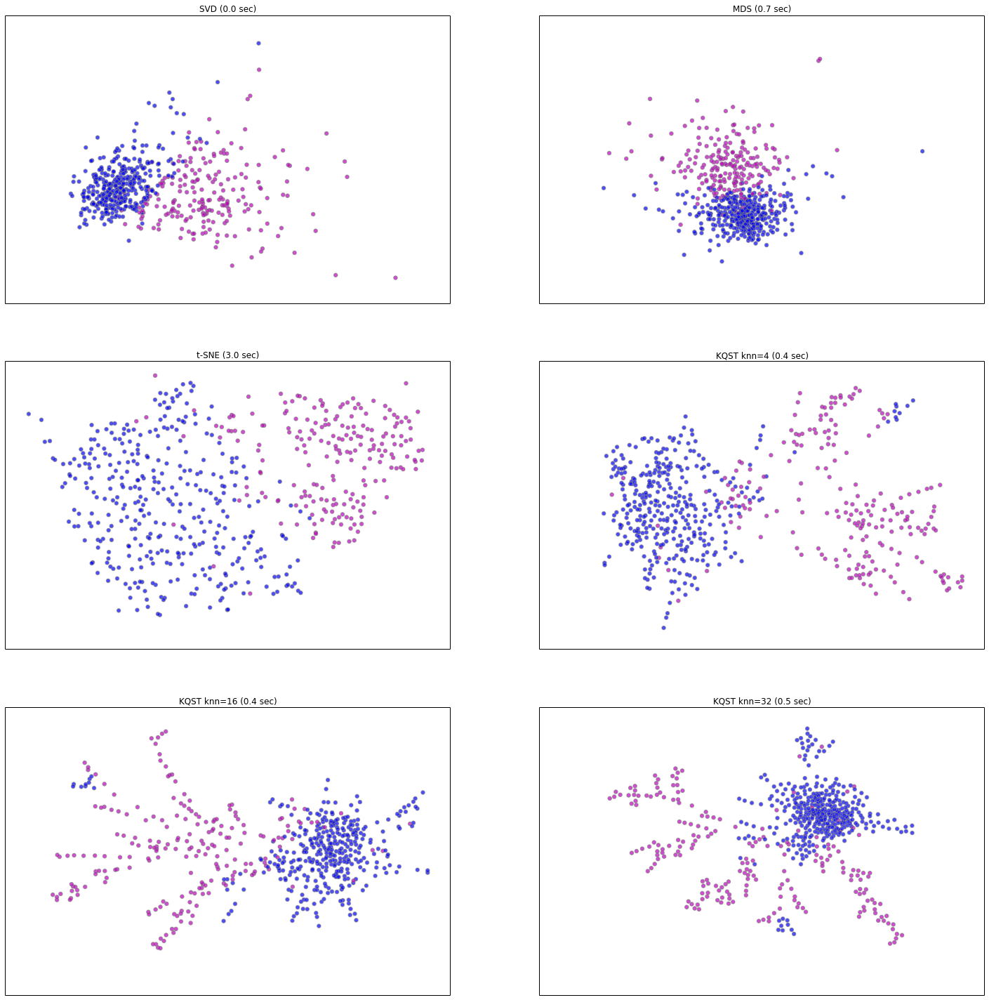

CPU times: user 5.4 s, sys: 208 ms, total: 5.61 s
Wall time: 8.07 s


In [14]:
%%time
%matplotlib inline
#breast-cancer-wisconsin
uri = 'http://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data'
from eden.util import read
M=[]
labels=[]
for line in read(uri):
    line = line.strip()
    if line:
        items = line.split(',')
        label = str(items[1])
        labels.append(label)
        data = [float(x) for x in items[2:]]
        M.append(data)

            
import numpy as np
from sklearn.preprocessing import normalize,scale
X = scale(np.array(M))
y=np.array(labels)

from eden.util.display import plot_embeddings
plot_embeddings(X,y)

ARS: 0.653624604391


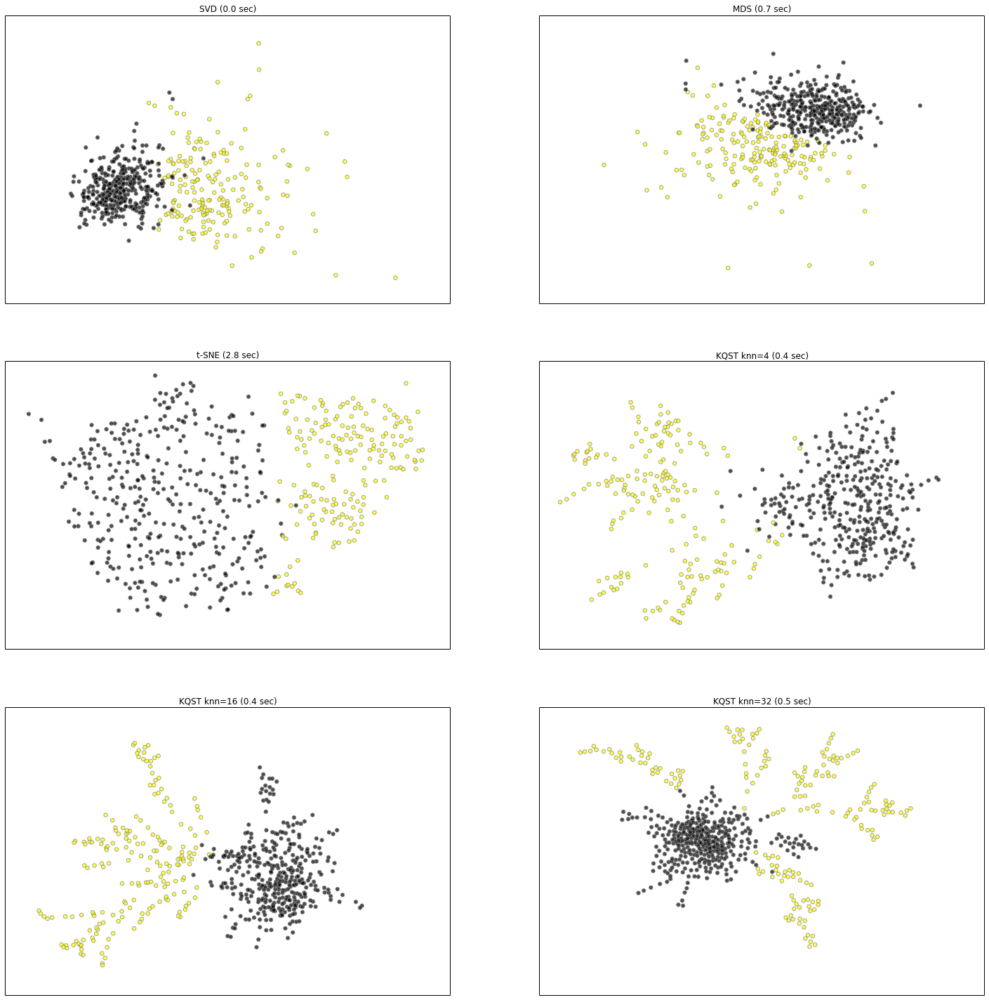

In [15]:
%matplotlib inline
from eden.util.display import KernelQuickShiftTreeEmbedding
Xemb=KernelQuickShiftTreeEmbedding(X, knn=16, k_threshold=0.9, metric='rbf', gamma=1e-4)
from sklearn.cluster import KMeans
km = KMeans(init='k-means++', n_clusters=len(set(y)), n_init=10)
yp = km.fit_predict(Xemb)
from sklearn.metrics import adjusted_rand_score 
print 'ARS:', adjusted_rand_score(y,yp)
from eden.util.display import plot_embeddings
plot_embeddings(X,yp)

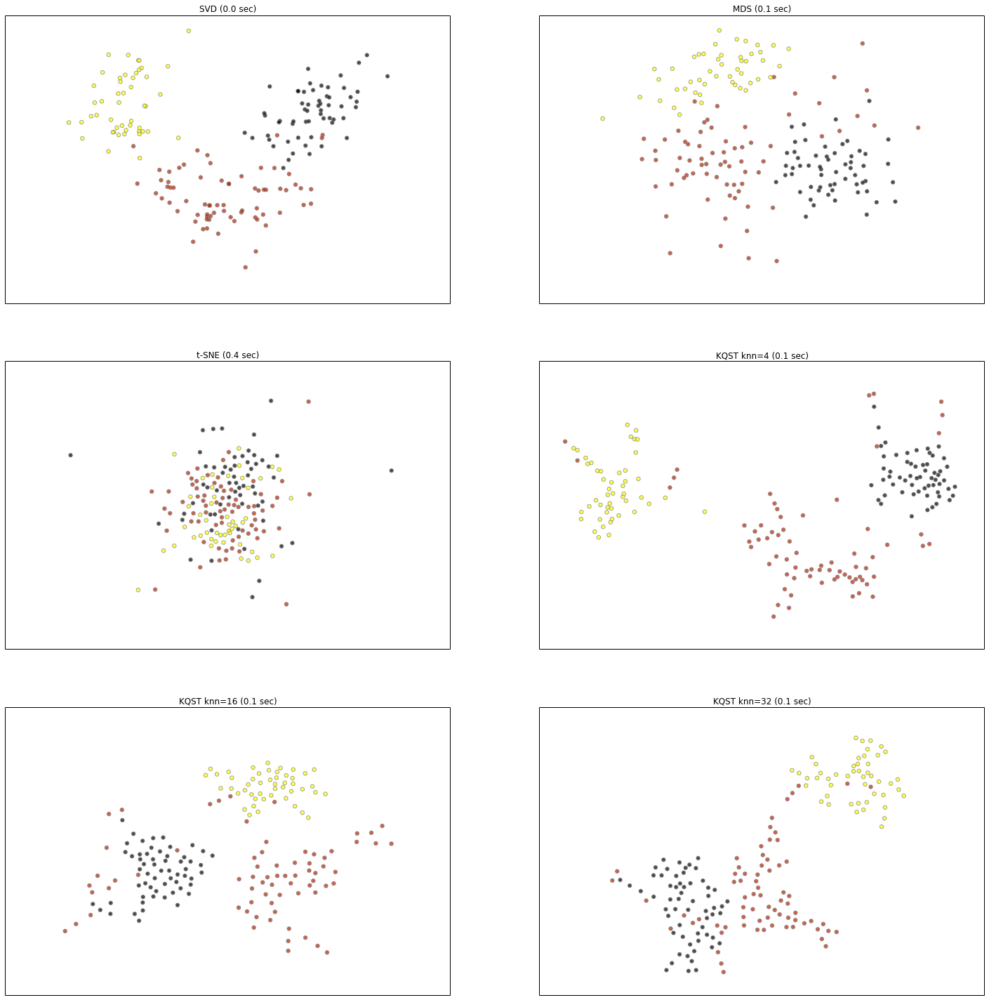

In [16]:
%matplotlib inline
uri = 'http://archive.ics.uci.edu/ml/machine-learning-databases/wine/wine.data'
from eden.util import read
M=[]
labels=[]
for line in read(uri):
    line = line.strip()
    if line:
        items = line.split(',')
        label = int(items[0])
        labels.append(label)
        data = [float(x) for x in items[1:]]
        M.append(data)

            
import numpy as np
from sklearn.preprocessing import normalize,scale
X = scale(np.array(M))
y=np.array(labels)

from eden.util.display import plot_embeddings
plot_embeddings(X,y)

ARS: 0.521698097871


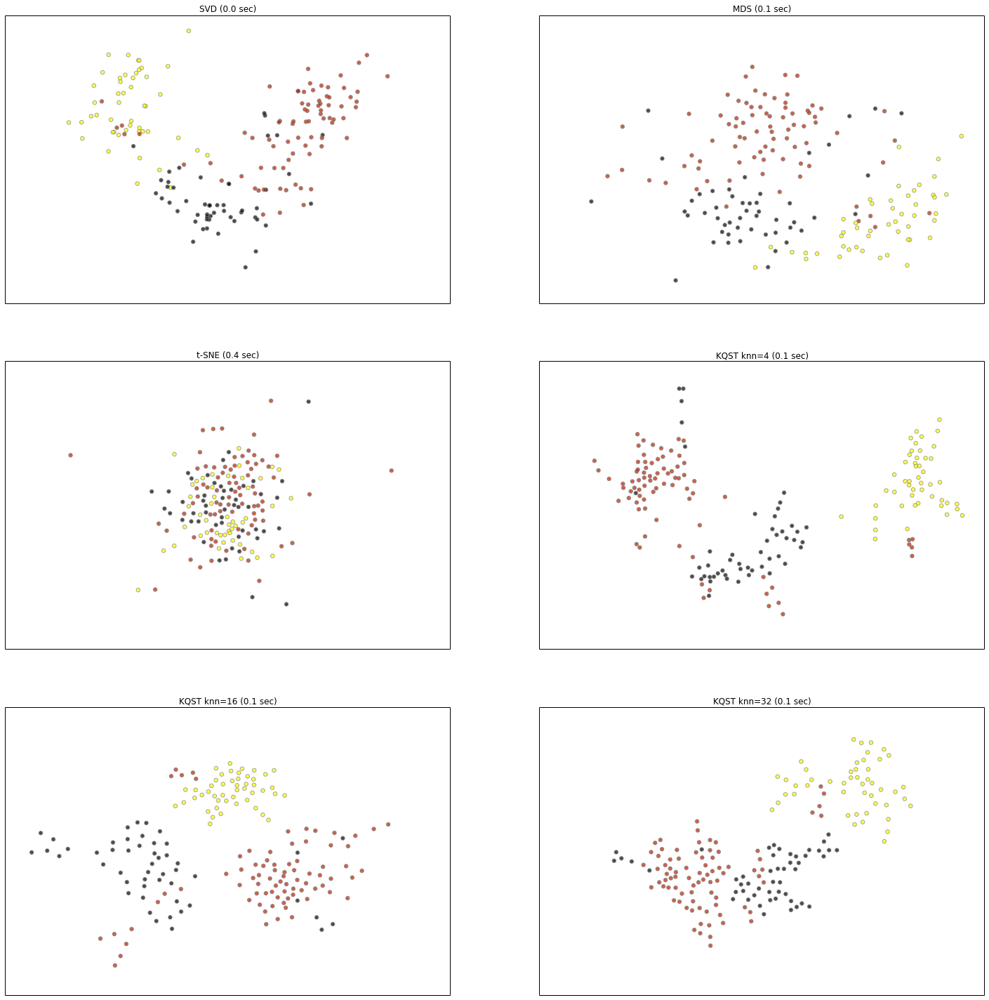

In [17]:
%matplotlib inline
from eden.util.display import KernelQuickShiftTreeEmbedding
Xemb=KernelQuickShiftTreeEmbedding(X, knn=16, k_threshold=0.9, metric='rbf', gamma=1e-4)
from sklearn.cluster import KMeans
km = KMeans(init='k-means++', n_clusters=len(set(y)), n_init=10)
yp = km.fit_predict(Xemb)
from sklearn.metrics import adjusted_rand_score 
print 'ARS:', adjusted_rand_score(y,yp)
from eden.util.display import plot_embeddings
plot_embeddings(X,yp)

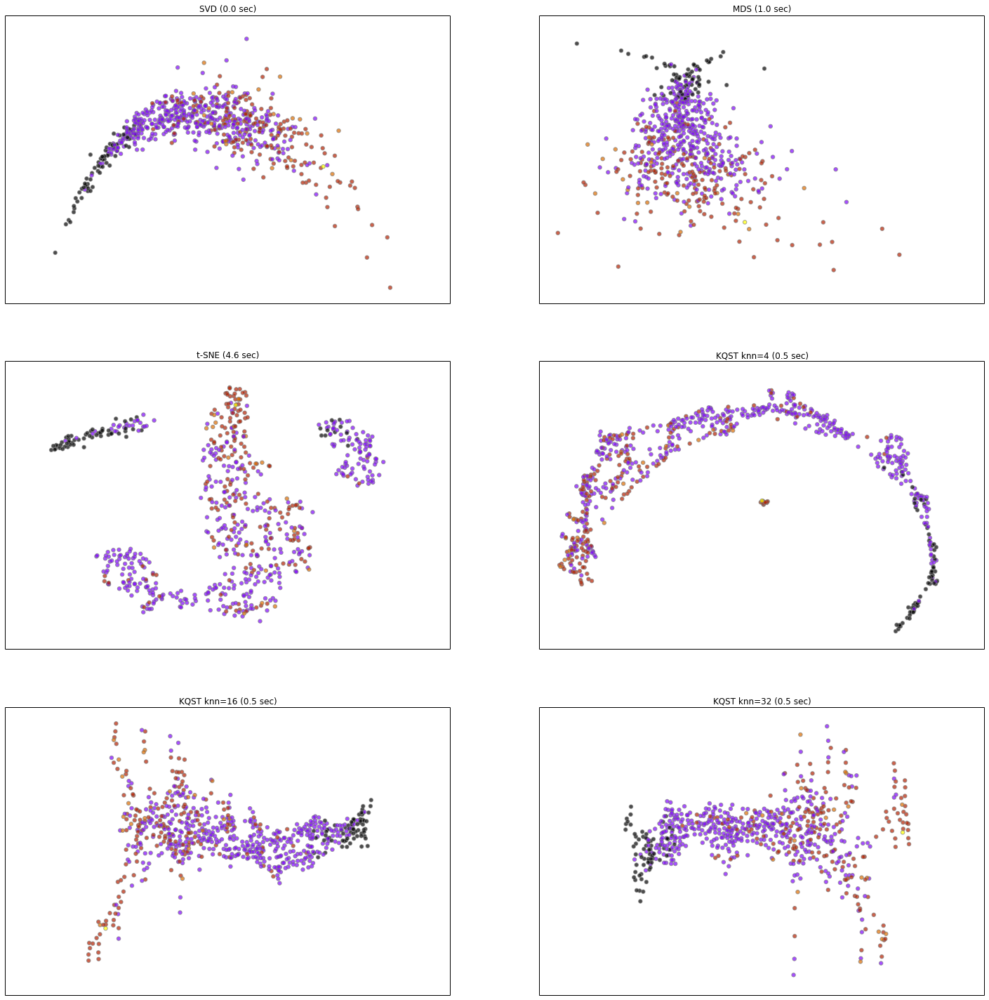

CPU times: user 7.51 s, sys: 325 ms, total: 7.83 s
Wall time: 11.2 s


In [18]:
%%time 
%matplotlib inline
uri = 'http://archive.ics.uci.edu/ml/machine-learning-databases/abalone/abalone.data'
n_max=700

from eden.util import read
M=[]
labels=[]
counter = 0
for line in read(uri):
    counter += 1
    if counter > n_max:
        break
    line = line.strip()
    if line:
        items = line.split(',')
        label = int(items[-1])//7
        labels.append(label)
        data = [float(x) for x in items[1:-1]]
        M.append(data)

            
import numpy as np
from sklearn.preprocessing import normalize,scale
X = scale(np.array(M))
y=np.array(labels)

from eden.util.display import plot_embeddings
plot_embeddings(X,y)

ARS: 0.0967483890197


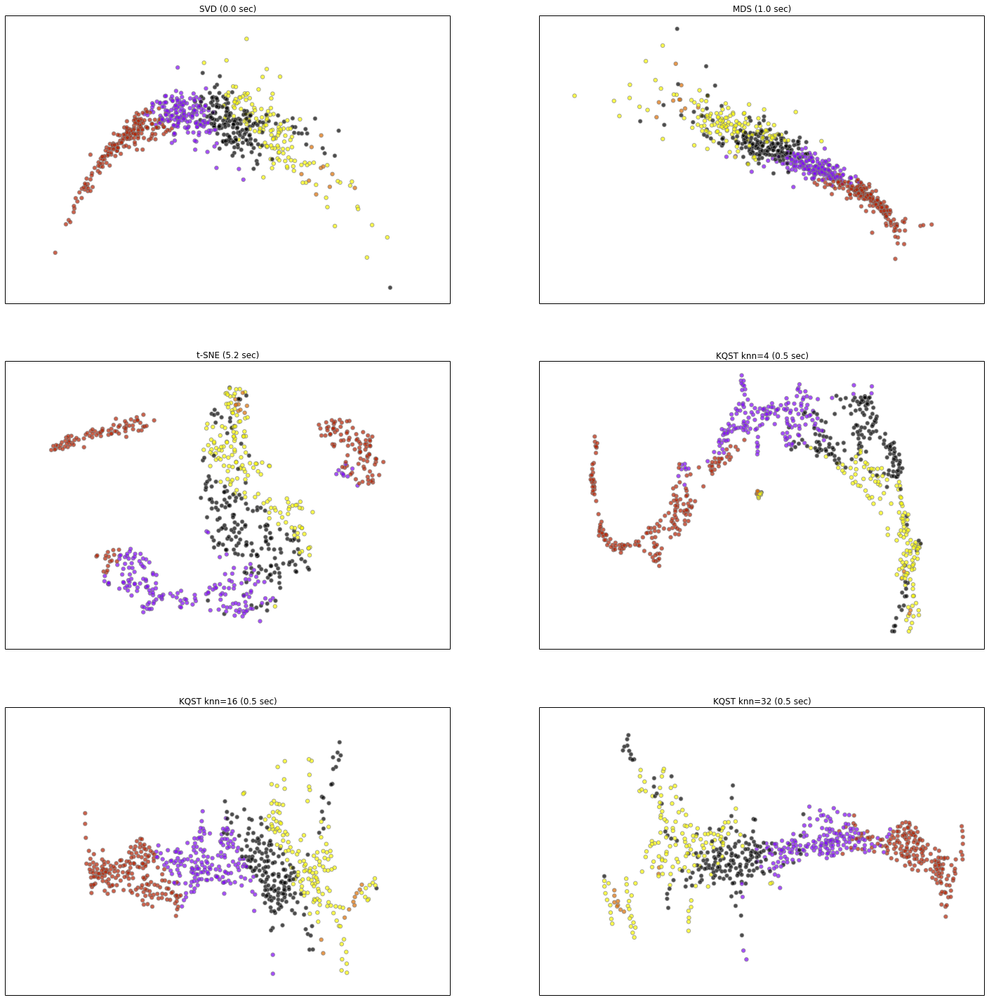

In [19]:
%matplotlib inline
from eden.util.display import KernelQuickShiftTreeEmbedding
Xemb=KernelQuickShiftTreeEmbedding(X, knn=16, k_threshold=0.9, metric='rbf', gamma=1e-4)
from sklearn.cluster import KMeans
km = KMeans(init='k-means++', n_clusters=len(set(y)), n_init=10)
yp = km.fit_predict(Xemb)
from sklearn.metrics import adjusted_rand_score 
print 'ARS:', adjusted_rand_score(y,yp)
from eden.util.display import plot_embeddings
plot_embeddings(X,yp)

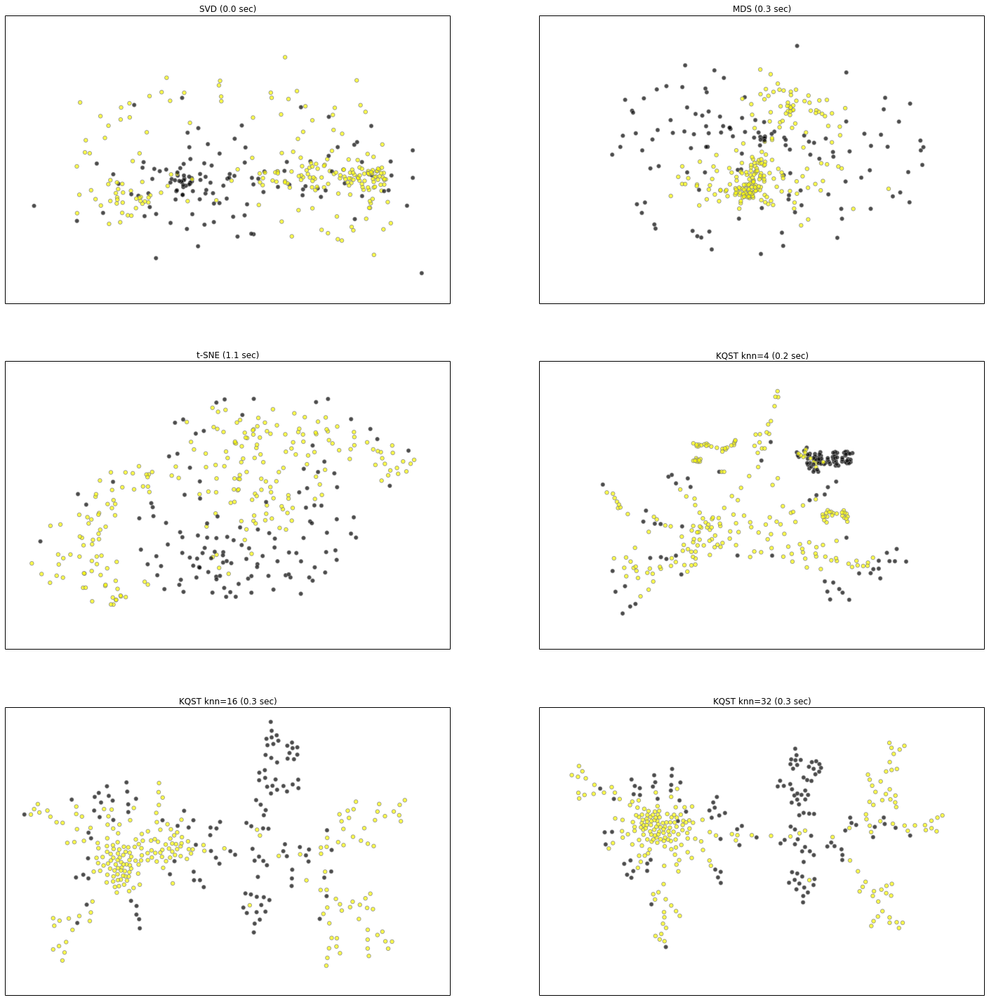

CPU times: user 2.75 s, sys: 85.8 ms, total: 2.84 s
Wall time: 4.67 s


In [20]:
%%time 
%matplotlib inline
uri = 'http://archive.ics.uci.edu/ml/machine-learning-databases/ionosphere/ionosphere.data'
n_max=700

from eden.util import read
M=[]
labels=[]
counter = 0
for line in read(uri):
    counter += 1
    if counter > n_max:
        break
    line = line.strip()
    if line:
        items = line.split(',')
        label = hash(items[-1])
        labels.append(label)
        data = [float(x) for x in items[:-1]]
        M.append(data)

            
import numpy as np
from sklearn.preprocessing import normalize,scale
X = scale(np.array(M))
y=np.array(labels)

from eden.util.display import plot_embeddings
plot_embeddings(X,y)

ARS: 0.144499220157


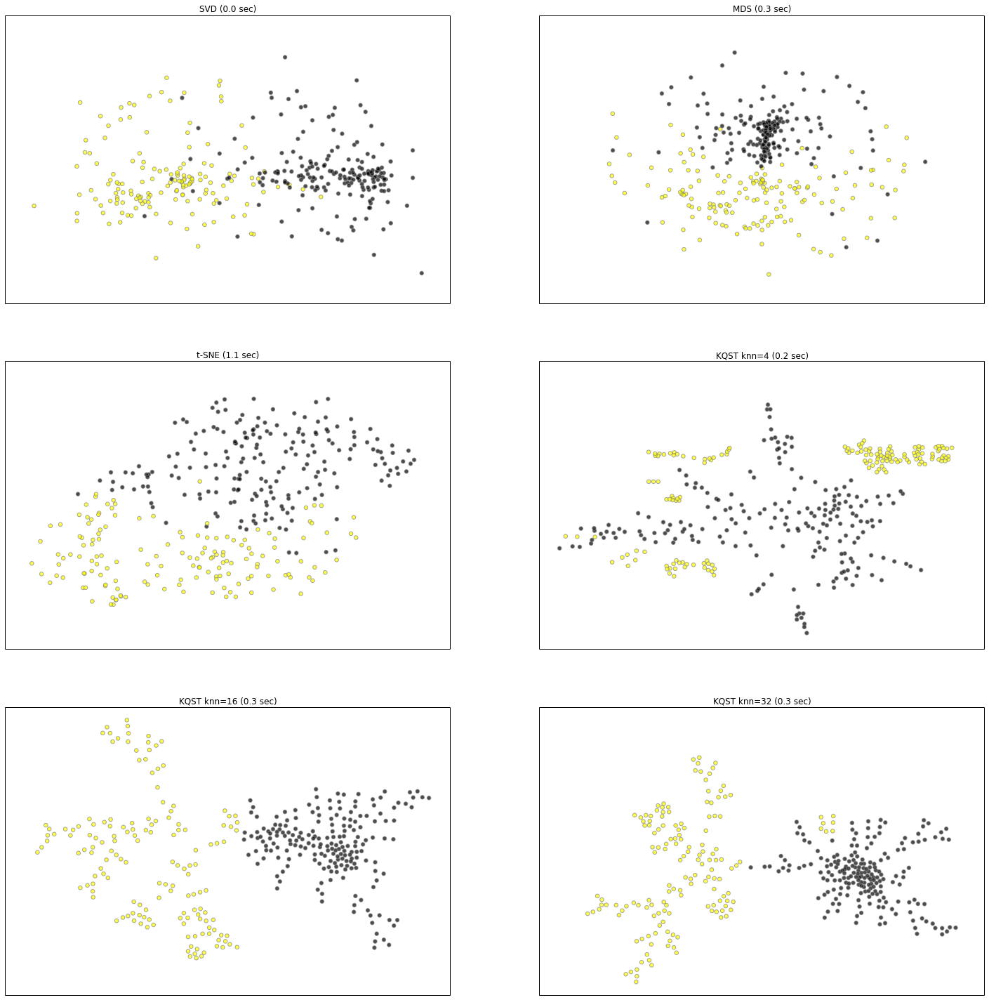

In [21]:
%matplotlib inline
from eden.util.display import KernelQuickShiftTreeEmbedding
Xemb=KernelQuickShiftTreeEmbedding(X, knn=16, k_threshold=0.9, metric='rbf', gamma=1e-4)
from sklearn.cluster import KMeans
km = KMeans(init='k-means++', n_clusters=len(set(y)), n_init=10)
yp = km.fit_predict(Xemb)
from sklearn.metrics import adjusted_rand_score 
print 'ARS:', adjusted_rand_score(y,yp)
from eden.util.display import plot_embeddings
plot_embeddings(X,yp)

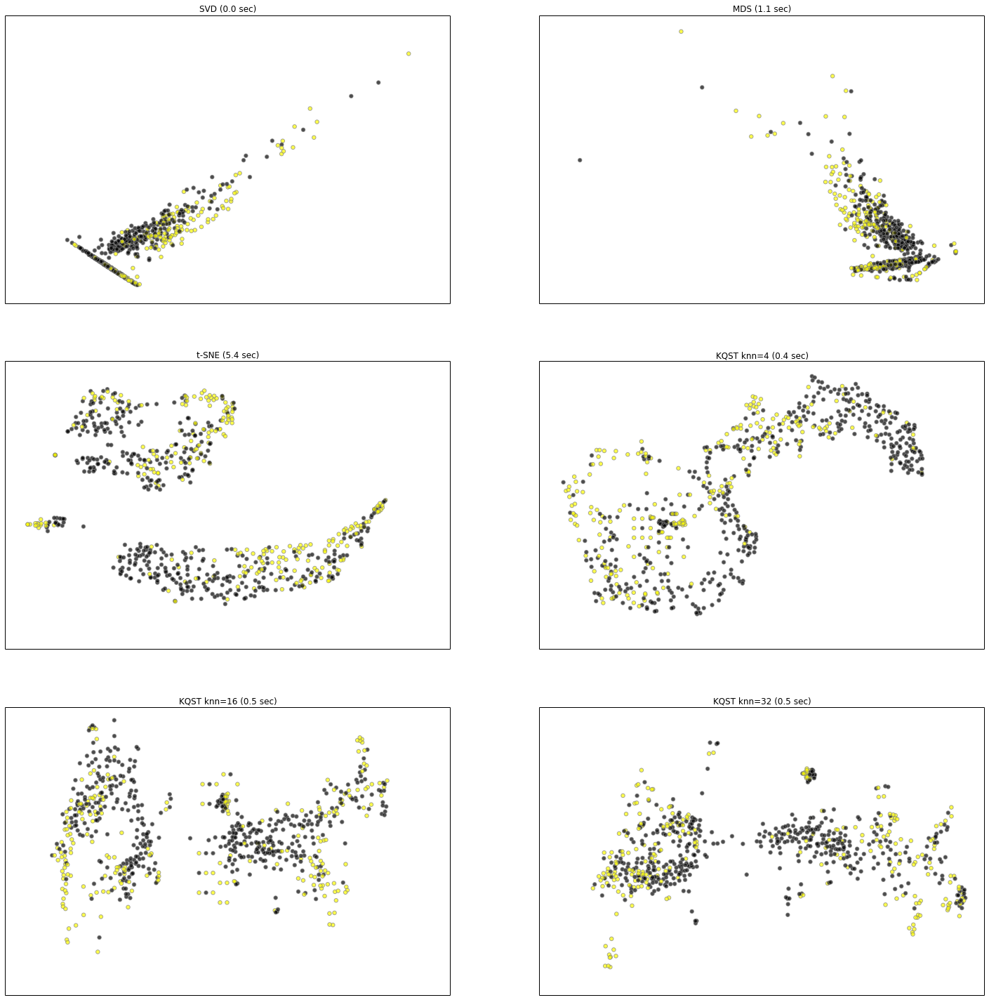

CPU times: user 8.15 s, sys: 363 ms, total: 8.52 s
Wall time: 9.72 s


In [22]:
%%time 
%matplotlib inline
uri = 'http://archive.ics.uci.edu/ml/machine-learning-databases/pima-indians-diabetes/pima-indians-diabetes.data'
n_max=700

from eden.util import read
M=[]
labels=[]
counter = 0
for line in read(uri):
    counter += 1
    if counter > n_max:
        break
    line = line.strip()
    if line:
        items = line.split(',')
        label = hash(items[-1])
        labels.append(label)
        data = [float(x) for x in items[:-1]]
        M.append(data)

            
import numpy as np
from sklearn.preprocessing import normalize,scale
X = (np.array(M))
y=np.array(labels)

from eden.util.display import plot_embeddings
plot_embeddings(X,y)

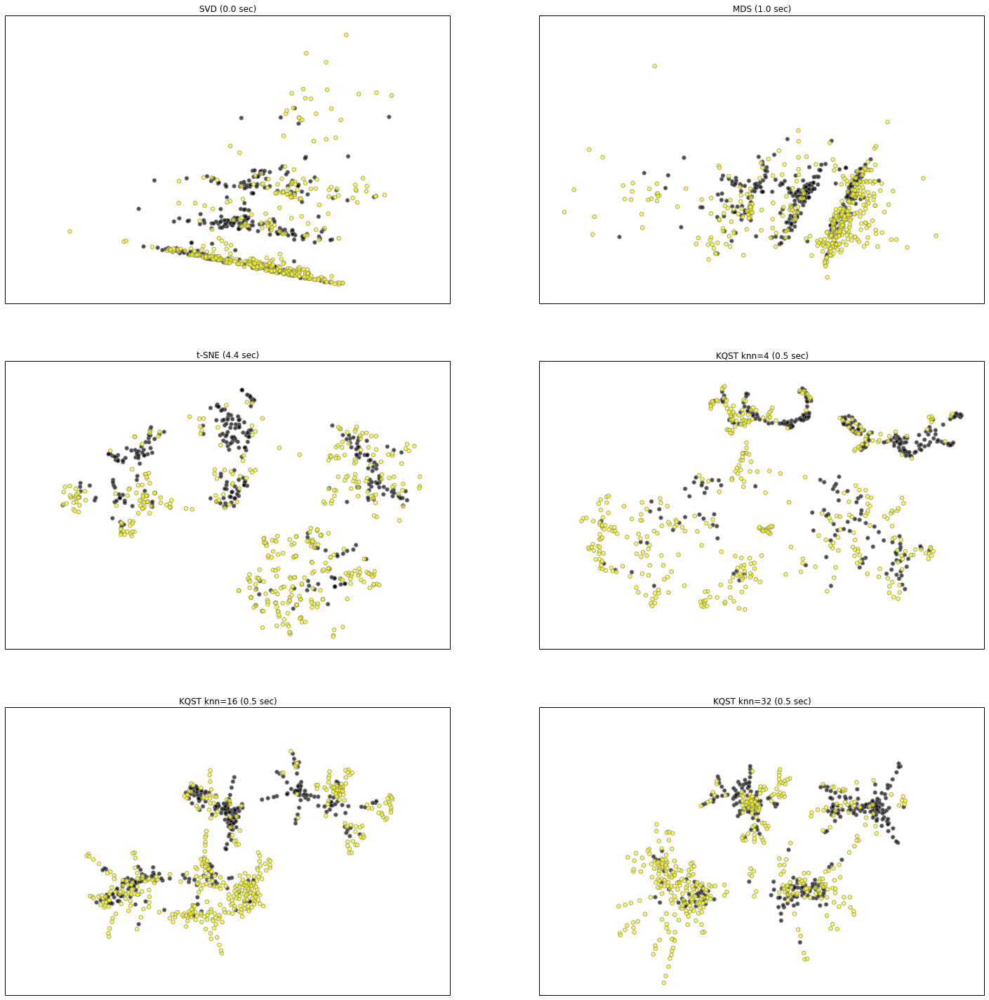

CPU times: user 7.27 s, sys: 314 ms, total: 7.59 s
Wall time: 9.44 s


In [23]:
%%time 
%matplotlib inline
uri = 'http://archive.ics.uci.edu/ml/machine-learning-databases/00254/biodeg.csv'
n_max=700

from eden.util import read
M=[]
labels=[]
counter = 0
for line in read(uri):
    counter += 1
    if counter > n_max:
        break
    line = line.strip()
    if line:
        items = line.split(';')
        label = hash(items[-1])
        labels.append(label)
        data = [float(x) for x in items[:-1]]
        M.append(data)

import numpy as np
from sklearn.preprocessing import normalize,scale
X = (np.array(M))
y=np.array(labels)

from eden.util.display import plot_embeddings
plot_embeddings(X,y)

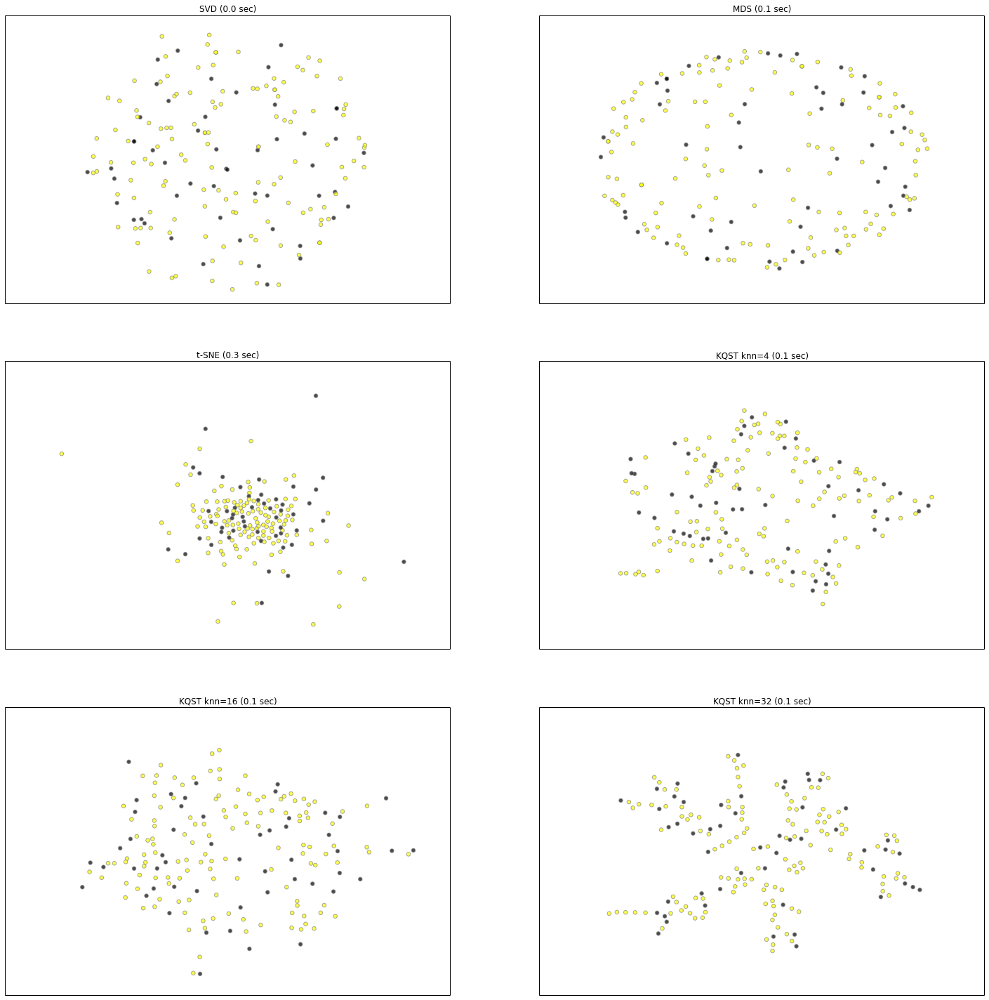

CPU times: user 1.57 s, sys: 51.6 ms, total: 1.62 s
Wall time: 2.71 s


In [24]:
%%time 
%matplotlib inline
uri = 'http://archive.ics.uci.edu/ml/machine-learning-databases/00230/plrx.txt'
n_max=700

from eden.util import read
M=[]
labels=[]
counter = 0
for line in read(uri):
    counter += 1
    if counter > n_max:
        break
    line = line.strip()
    if line:
        items = line.split('\t')
        label = hash(items[-1])
        labels.append(label)
        data = [float(x) for x in items[:-1]]
        M.append(data)

import numpy as np
from sklearn.preprocessing import normalize,scale
X = normalize(np.array(M))
y=np.array(labels)

from eden.util.display import plot_embeddings
plot_embeddings(X,y)

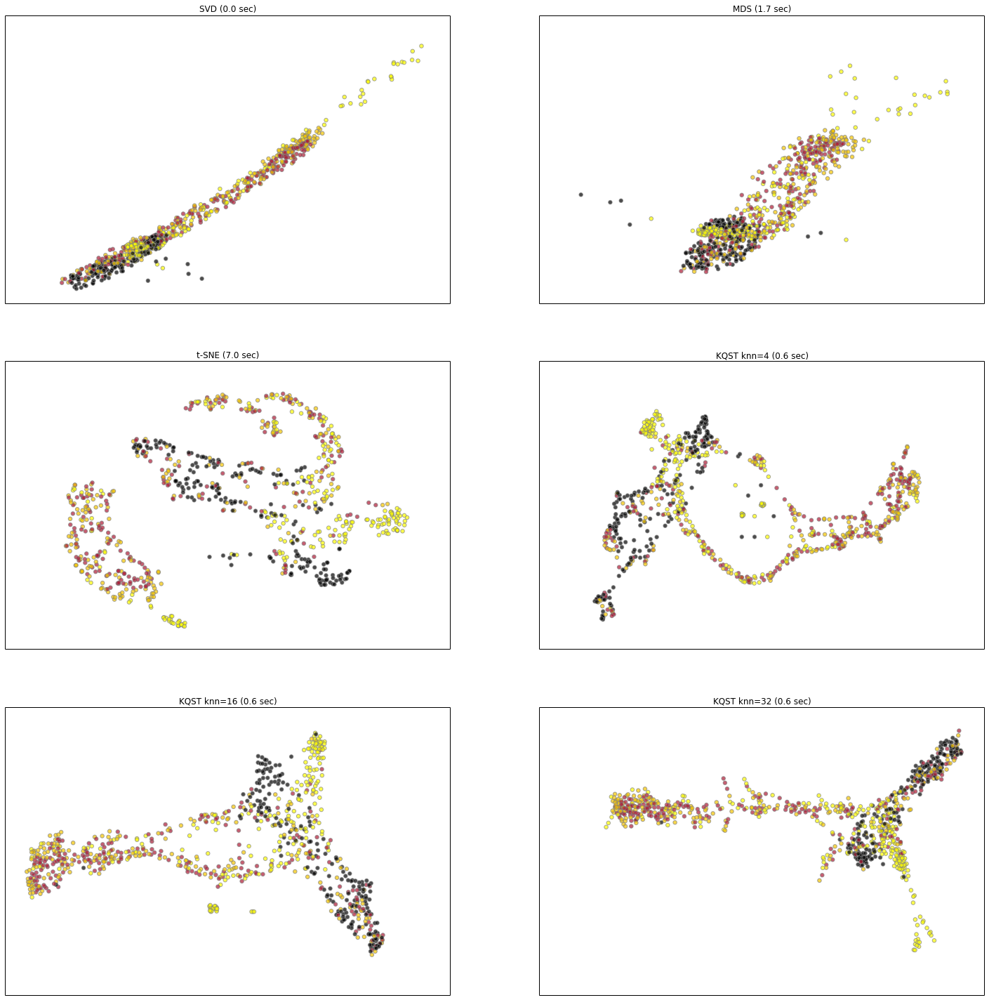

CPU times: user 10.4 s, sys: 718 ms, total: 11.1 s
Wall time: 15.5 s


In [25]:
%%time 
%matplotlib inline
import numpy as np

def load_data(uri):
    from eden.util import read
    M=[]
    labels=[]
    counter = 0
    for line in read(uri):
        counter += 1
        if counter > n_max:
            break
        line = line.strip()
        if line:
            items = line.split(' ')
            label = hash(items[-1])
            labels.append(label)
            data = [float(x) for x in items[:-1]]
            M.append(data)
    X = np.array(M)
    y=np.array(labels)
    return X,y

for i,c in enumerate('abcdefghi'):
    uri = 'http://archive.ics.uci.edu/ml/machine-learning-databases/statlog/vehicle/xa%s.dat'%c
    X_,y_ = load_data(uri)
    if i==0:
        X=X_
        y=y_
    else:
        X=np.vstack((X,X_))
        y=np.vstack((y,y_))

from sklearn.preprocessing import normalize,scale
#X = scale(X)

from eden.util.display import plot_embeddings
plot_embeddings(X,y)